# Notebook 1: Basic Scanpy Spatial Analysis
## Analysis and Visualization of Spatial Transcriptomics Data

**Dataset:** Human Lymph Node (10x Genomics Visium)  
**Tools:** Scanpy, Seaborn, Matplotlib

### What is Spatial Transcriptomics?
Spatial transcriptomics lets us measure gene expression (which genes are active) in a tissue sample while keeping track of *where* each measurement came from. In Visium technology, a glass slide is covered with spots (each ~55 micrometers wide). A tissue slice is placed on top. Each spot captures RNA from the cells above it. We then know both the gene expression AND the physical location of each spot.

### What is AnnData?
`AnnData` (Annotated Data) is the main data structure used in Scanpy. Think of it like a spreadsheet where rows are spots/cells and columns are genes, plus extra metadata attached to it.

## Step 1: Import Libraries

We import the tools we need:
- `matplotlib` and `seaborn`: for making plots
- `scanpy` (`sc`): the main analysis library for single-cell and spatial data
- `pandas`: for handling tables of data

In [4]:
!pip install scanpy squidpy igraph leidenalg scikit-image dask seaborn

In [5]:
from __future__ import annotations

import matplotlib.pyplot as plt
import pandas as pd
import scanpy as sc
import seaborn as sns

## Step 2: Configure Settings

- `print_versions()`: prints the version of each library so our analysis is reproducible
- `set_figure_params()`: sets the default look of our plots (white background, size 8x8)
- `verbosity = 3`: makes Scanpy print detailed progress messages as it runs

In [6]:
sc.logging.print_versions()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 3

/tmp/ipykernel_2763/679762080.py:1: FutureWarning: Use `print_header` instead
  sc.logging.print_versions()


## Step 3: Load the Data

We load a publicly available Visium dataset of a **human lymph node** from 10x Genomics.

- `visium_sge()`: automatically downloads the dataset and loads it into an `AnnData` object. It contains the gene expression counts, the H&E tissue image, and the spatial coordinates of each spot.
- `var_names_make_unique()`: ensures all gene names are unique (some genes can appear twice in the data).
- `adata.var['mt']`: we flag genes that start with 'MT-' as mitochondrial genes. High mitochondrial gene expression often indicates dead or damaged cells.
- `calculate_qc_metrics()`: calculates quality control (QC) statistics for each spot, such as total counts and percentage of mitochondrial reads.

In [7]:
adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

/tmp/ipykernel_2763/1997158664.py:1: FutureWarning: Use `squidpy.datasets.visium` instead.
  adata = sc.datasets.visium_sge(sample_id="V1_Human_Lymph_Node")


  0%|          | 0.00/7.86M [00:00<?, ?B/s]

  0%|          | 0.00/29.3M [00:00<?, ?B/s]

reading data/V1_Human_Lymph_Node/filtered_feature_bc_matrix.h5
 (0:00:01)


/usr/local/lib/python3.12/dist-packages/anndata/_core/anndata.py:1880: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


## Step 4: Inspect the Data

Let's look at the structure of our AnnData object. It should show:
- `n_obs`: number of spots (rows)
- `n_vars`: number of genes (columns)
- Various metadata columns added by the QC step

In [8]:
adata

AnnData object with n_obs × n_vars = 4035 × 36601
    obs: 'in_tissue', 'array_row', 'array_col', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'spatial'

## Step 5: Quality Control (QC) - Plot Distributions

Before analysis, we need to remove low-quality spots. We plot histograms of:
1. **Total counts per spot**: How many RNA molecules were captured in each spot. Very low counts suggest poor quality spots.
2. **Total counts (zoomed in)**: Focused view of the distribution below 10,000 to see the low-count region more clearly.
3. **Genes per spot**: How many unique genes were detected in each spot.
4. **Genes per spot (zoomed in)**: Focused view below 4,000 genes.

These plots help us decide cutoff thresholds for filtering.

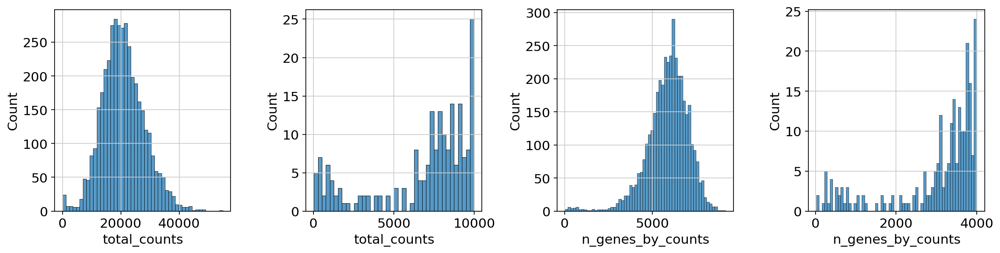

In [9]:
fig, axs = plt.subplots(1, 4, figsize=(15, 4))
sns.histplot(adata.obs["total_counts"], kde=False, ax=axs[0])
sns.histplot(
    adata.obs["total_counts"][adata.obs["total_counts"] < 10000],
    kde=False,
    bins=40,
    ax=axs[1],
)
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2])
sns.histplot(
    adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 4000],
    kde=False,
    bins=60,
    ax=axs[3],
)
plt.tight_layout()
plt.savefig("qc_histograms.jpeg", dpi=150)
plt.show()

## Step 6: Filter Low-Quality Spots and Genes

Based on the QC plots, we filter out:
- Spots with **fewer than 5,000 counts** (too few RNA captured — likely poor quality spots)
- Spots with **more than 35,000 counts** (too many — could be technical artifacts or doublets)
- Spots where **more than 20% of reads are mitochondrial** (dying cells release mitochondrial RNA)
- Genes detected in **fewer than 10 spots** (very rare genes add noise without much information)

In [10]:
sc.pp.filter_cells(adata, min_counts=5000)
sc.pp.filter_cells(adata, max_counts=35000)
adata = adata[adata.obs["pct_counts_mt"] < 20].copy()
print(f"#cells after MT filter: {adata.n_obs}")
sc.pp.filter_genes(adata, min_cells=10)

filtered out 44 cells that have less than 5000 counts
filtered out 130 cells that have more than 35000 counts
#cells after MT filter: 3861
filtered out 16916 genes that are detected in less than 10 cells


## Step 7: Normalize and Find Highly Variable Genes

After filtering, we preprocess the data:

- **`normalize_total()`**: Each spot may have captured different total amounts of RNA. We scale all spots to have the same total count so they are comparable. This is like adjusting for library size.
- **`log1p()`**: We apply a log transformation (log(count + 1)). This compresses the scale so that very highly expressed genes don't dominate the analysis.
- **`highly_variable_genes()`**: Genes that vary a lot across spots carry the most biological information. We select the top 2,000 most variable genes for downstream analysis. This reduces noise from genes that don't change.

In [11]:
sc.pp.normalize_total(adata, inplace=True)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)

normalizing counts per cell
    finished (0:00:02)
extracting highly variable genes
    finished (0:00:02)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


## Step 8: Dimensionality Reduction and Clustering

We have thousands of genes — that's too many dimensions to visualize or cluster directly. We reduce this step by step:

- **`pca()`**: Principal Component Analysis (PCA) compresses the ~2000 gene dimensions into 50 "principal components" that capture most of the variation. Think of it like finding the most important axes of variation.
- **`neighbors()`**: Finds the nearest neighbors for each spot in PCA space — spots with similar gene expression are neighbors.
- **`umap()`**: UMAP (Uniform Manifold Approximation and Projection) projects the data into 2D for visualization, preserving the neighborhood structure. Similar spots appear close together.
- **`leiden()`**: Groups spots into clusters based on their neighborhood connections. Each cluster ideally represents a distinct tissue region or cell type composition.

In [12]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, key_added="clusters", flavor="igraph", directed=False, n_iterations=2)

computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:07)
running Leiden clustering
    finished: found 10 clusters and added
    'clusters', the cluster labels (adata.obs, categorical) (0:00:00)


## Step 9: Visualize Clusters on UMAP

We plot the UMAP colored by:
- **Total counts**: Are high-count spots clustering together? (Would suggest a technical batch effect)
- **Genes by counts**: Same check for gene richness
- **Leiden clusters**: The actual biological groupings we found

Ideally, total_counts and n_genes_by_counts should NOT show a strong cluster structure — that would indicate the clusters are driven by biology, not technical factors.

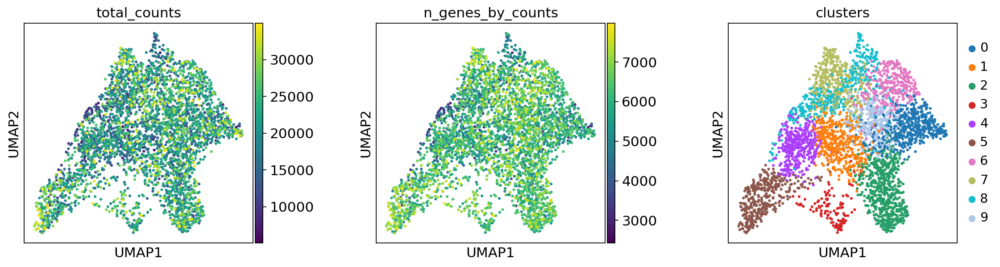

<Figure size 320x320 with 0 Axes>

In [13]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(adata, color=["total_counts", "n_genes_by_counts", "clusters"], wspace=0.4)
plt.savefig("umap_clusters.jpeg", dpi=150, bbox_inches="tight")
plt.show()

## Step 10: Visualize Gene Expression in Spatial Context

This is the key feature of spatial transcriptomics — we can overlay data onto the actual tissue image!

- `sc.pl.spatial()` overlays colored circles on the H&E tissue image, where each circle is one Visium spot.
- Here we color spots by `total_counts` and `n_genes_by_counts` to see if certain tissue regions are more transcriptionally active.
- `img_key="hires"` uses the high-resolution tissue image as the background.

/tmp/ipykernel_2763/264347325.py:2: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])


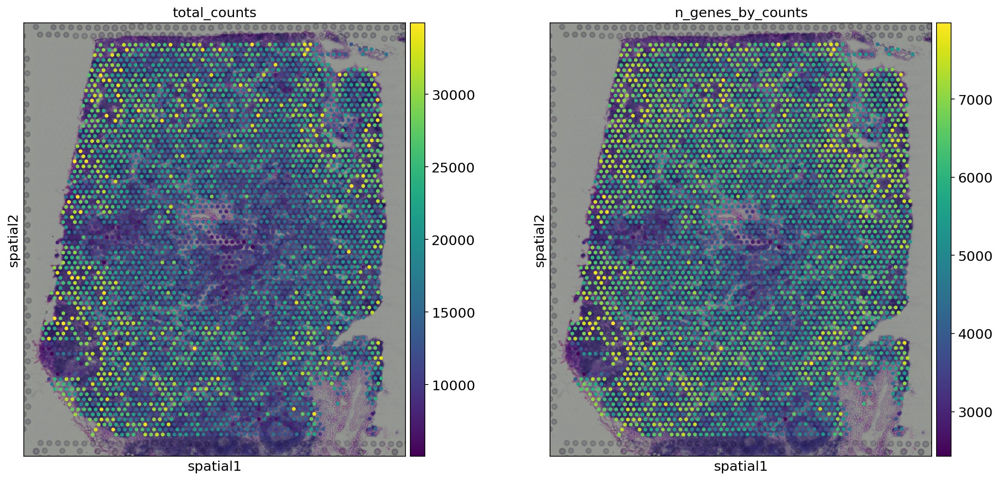

<Figure size 640x640 with 0 Axes>

In [14]:
plt.rcParams["figure.figsize"] = (8, 8)
sc.pl.spatial(adata, img_key="hires", color=["total_counts", "n_genes_by_counts"])
plt.savefig("spatial_counts.jpeg", dpi=150, bbox_inches="tight")
plt.show()

## Step 11: Visualize Clusters in Spatial Context

Now we overlay the Leiden clusters on the tissue. This tells us:
- Do spots with similar gene expression also occupy similar physical regions?
- Can we identify distinct tissue structures (like germinal centers, B-cell follicles, etc. in a lymph node)?

If the clusters align with visible tissue structures, that validates our analysis.

/tmp/ipykernel_2763/2056740985.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)


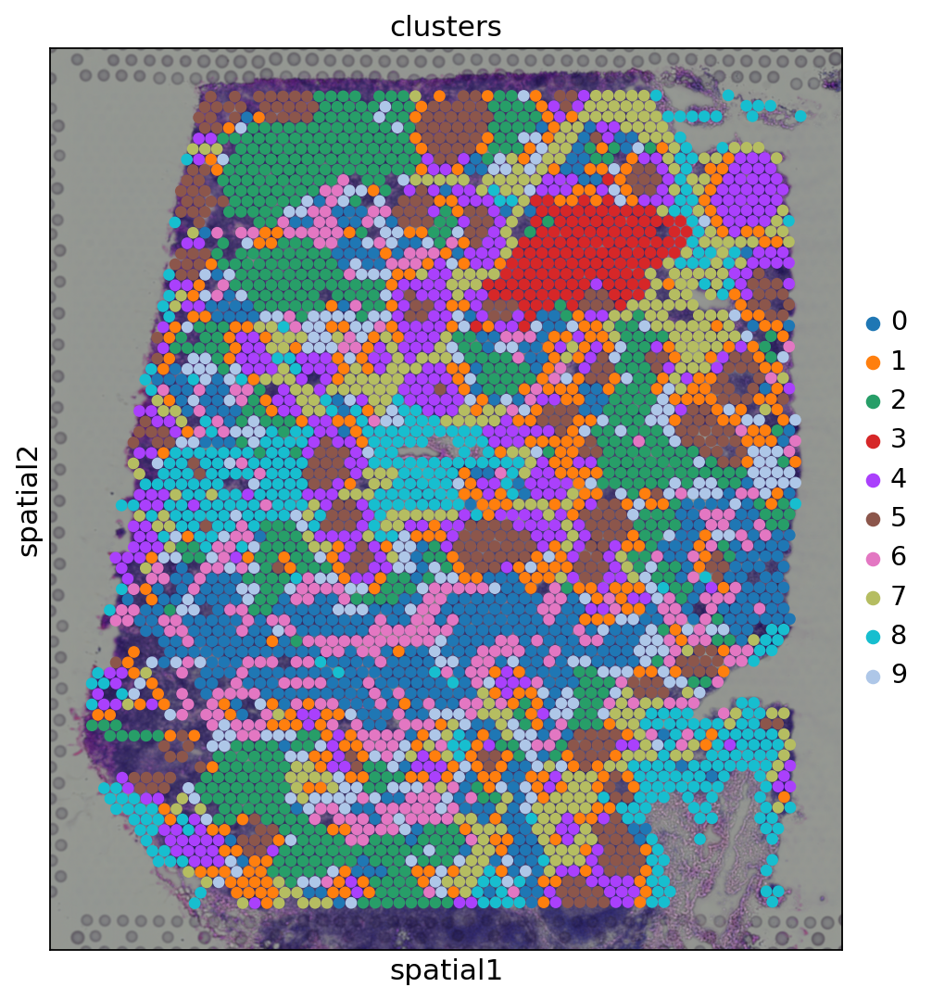

<Figure size 640x640 with 0 Axes>

In [15]:
sc.pl.spatial(adata, img_key="hires", color="clusters", size=1.5)
plt.savefig("spatial_clusters.jpeg", dpi=150, bbox_inches="tight")
plt.show()

## Step 12: Zoom into Specific Clusters

We zoom in on clusters 5 and 9 using `crop_coord` to get a closer look at their spatial organization.
- `groups=["5", "9"]`: Only show spots from these two clusters
- `alpha=0.5`: Make the spot dots semi-transparent so we can see the tissue underneath
- `crop_coord=[left, right, top, bottom]`: Crop to this pixel region of the image

/tmp/ipykernel_2763/3262333628.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


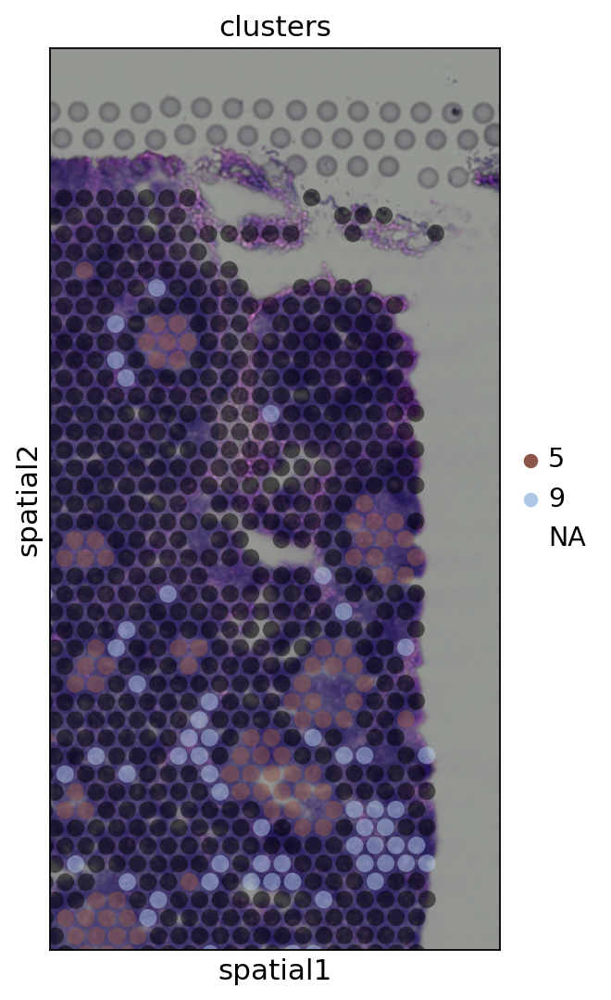

<Figure size 640x640 with 0 Axes>

In [16]:
sc.pl.spatial(
    adata,
    img_key="hires",
    color="clusters",
    groups=["5", "9"],
    crop_coord=[7000, 10000, 0, 6000],
    alpha=0.5,
    size=1.3,
)
plt.savefig("spatial_clusters_zoom.jpeg", dpi=150, bbox_inches="tight")
plt.show()

## Step 13: Find Cluster Marker Genes

Marker genes are genes that are significantly more expressed in one cluster compared to all others. They help us understand what biological cell type or state each cluster represents.

- `rank_genes_groups()`: Uses a t-test to statistically compare gene expression between each cluster and the rest.
- `rank_genes_groups_heatmap()`: Displays a heatmap of the top 10 marker genes for cluster 9. Each row is a gene, each column is a cluster, and the color shows expression level.

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:02)
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_clusters']`
categories: 0, 1, 2, etc.
var_group_labels: 9


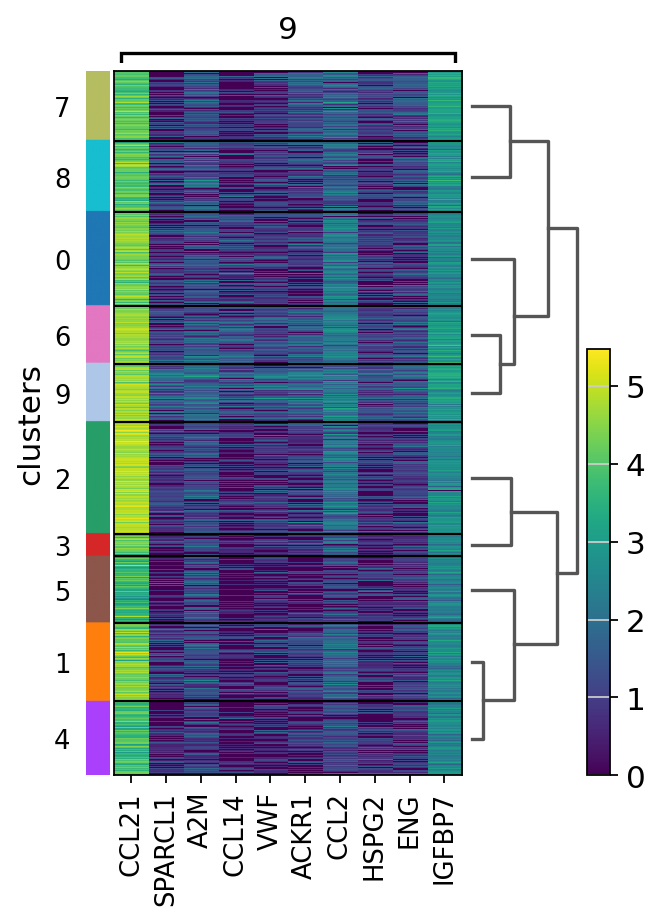

<Figure size 640x640 with 0 Axes>

In [17]:
sc.tl.rank_genes_groups(adata, "clusters", method="t-test")
sc.pl.rank_genes_groups_heatmap(adata, groups="9", n_genes=10, groupby="clusters")
plt.savefig("marker_genes_heatmap.jpeg", dpi=150, bbox_inches="tight")
plt.show()

## Step 14: Visualize Specific Marker Genes Spatially

We identified CR2 as a marker gene for cluster 9. CR2 (Complement Receptor 2) is a marker for B cells — specifically mature B cells in follicles.

By overlaying CR2 expression spatially, we can confirm that cluster 9 corresponds to B-cell follicles in the lymph node tissue. The spatial pattern of CR2 expression should match the spatial location of cluster 9.

/tmp/ipykernel_2763/2140467493.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["clusters", "CR2"])


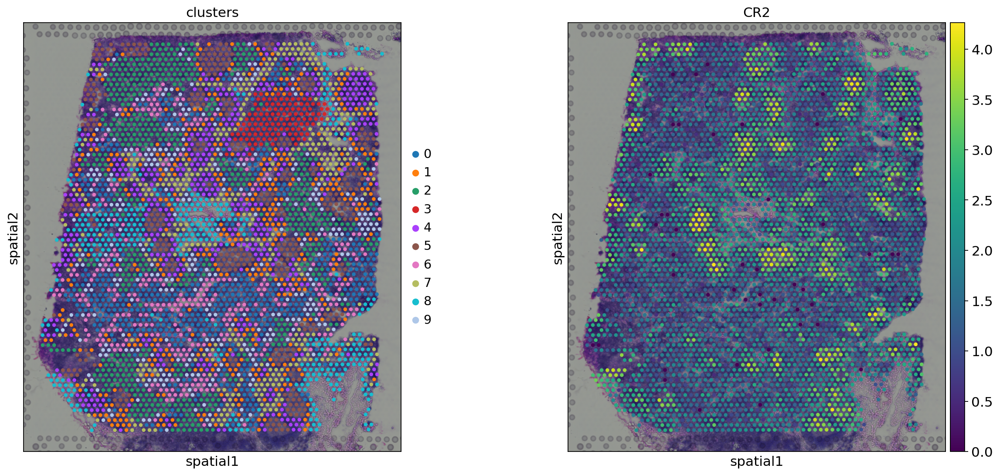

<Figure size 640x640 with 0 Axes>

In [18]:
sc.pl.spatial(adata, img_key="hires", color=["clusters", "CR2"])
plt.savefig("spatial_cr2.jpeg", dpi=150, bbox_inches="tight")
plt.show()

## Step 15: Visualize Additional Genes Spatially

We can visualize any gene's expression spatially. Here we look at:
- **COL1A2**: A collagen gene — marks stromal/fibroblast regions in the tissue
- **SYPL1**: A synaptoporin-like gene — marks specific cell populations

The `alpha=0.7` makes the spots slightly transparent so the tissue image is still visible underneath.

/tmp/ipykernel_2763/2992822665.py:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)


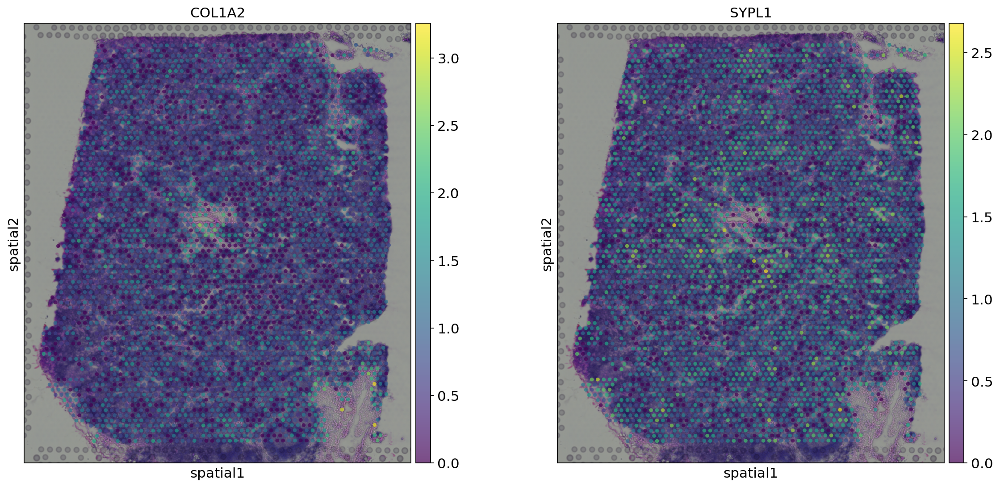

<Figure size 640x640 with 0 Axes>

In [19]:
sc.pl.spatial(adata, img_key="hires", color=["COL1A2", "SYPL1"], alpha=0.7)
plt.savefig("spatial_col1a2_sypl1.jpeg", dpi=150, bbox_inches="tight")
plt.show()

## Summary

In this notebook we performed a complete basic spatial transcriptomics analysis:

1. **Loaded** a Human Lymph Node Visium dataset
2. **Quality control**: filtered out poor-quality spots and rare genes
3. **Normalization**: made spots comparable by scaling total counts
4. **Dimensionality reduction**: PCA → UMAP for visualization
5. **Clustering**: Leiden algorithm grouped spots by transcriptional similarity
6. **Spatial visualization**: overlaid clusters and gene expression on the H&E tissue image
7. **Marker genes**: identified genes defining each cluster, confirming biological identity

The key insight is that spots with similar gene expression tend to be spatially adjacent, and these spatial domains correspond to known tissue structures (e.g., B-cell follicles marked by CR2).